In [1]:
#!/bin/env python

from __future__ import absolute_import, division, print_function, unicode_literals

import sys,os,os.path,time
sys.path.append(os.path.expanduser('/global/u1/r/rgupta2/.local/lib/python3.7/site-packages/'))

# export PYTHONPATH="${PYTHONPATH}:/usr/local/lib/python2.7/site-packages:/usr/lib/python2.7/site-packages"


# import matplotlib.style
# import matplotlib as mpl
# mpl.use('Agg')
# # mpl.style.use('seaborn')
# mpl.rc('image', cmap='gray')

import matplotlib.pyplot as plt
	
%matplotlib inline
plt.rcParams['figure.figsize'] = (8,10)


import time, re, sys, os                                                
from tqdm import tqdm, trange

import pandas as pd
import xarray as xr
from glob import glob
import numpy as np
from scipy import stats
# Install a pip package in the current Jupyter kernel
# !{sys.executable} -m pip install --user Pillow

from PIL import Image
from random import seed
from random import randint

import tensorflow as tf


In [2]:
print(tf.__version__)

1.15.0


In [3]:

# exp_name =  "original_batch_size_normalized_fixed_offset_feature_matching_step_annealing_custom_cropping_logan_annealed_omega_128"

exp_name = 'new_dataset_logan_annealed_omega_128'

# "precipitation_normalized_training_with_logan_feature_matching_fixed_offset_192_resolution_128_correct_chi"
# "fixed_offset_normalized_feature_matching_step_annealing_custom_cropping_logan_annealed_omega_128"

checkpoint_dir = "/global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/{}/checkpoint".format(exp_name)
counter = 94375


model_dir = "Climate-StyleGAN_climate_stylegan2900_128to128"



checkpoint_dir = os.path.join(checkpoint_dir, model_dir)

print(" [*] Reading checkpoints from {} with counter {} ".format(checkpoint_dir, counter))
states = tf.train.get_checkpoint_state(checkpoint_dir)

print(type(states))

if(counter == 0):
    if (states and states.model_checkpoint_path):
        checkpoint_paths = states.all_model_checkpoint_paths
        load_model_path = checkpoint_paths[-1]  
        counter = int(load_model_path.split('-')[-1])
        print(" [*] Success to read {} with counter {} ".format(load_model_path, counter))
      
    else:
        print(" [*] Failed to find a checkpoint")
        counter = -1
else:
    specific_checkpoint_name = "/Climate-StyleGAN.model-{}".format(counter)
    load_model_path =  checkpoint_dir + specific_checkpoint_name
    # self.saver.restore(self.sess, load_model_path)
    print(" [*] Success to read {}".format(load_model_path))





# tf.train.latest_checkpoint
# with tf.Session() as sess:
#     new_saver = tf.train.import_meta_graph('my_test_model-1000.meta')
#     new_saver.restore(sess, tf.train.latest_checkpoint('./'))

 [*] Reading checkpoints from /global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/new_dataset_logan_annealed_omega_128/checkpoint/Climate-StyleGAN_climate_stylegan2900_128to128 with counter 94375 
<class 'tensorflow.python.training.checkpoint_state_pb2.CheckpointState'>
 [*] Success to read /global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/new_dataset_logan_annealed_omega_128/checkpoint/Climate-StyleGAN_climate_stylegan2900_128to128/Climate-StyleGAN.model-94375


In [4]:
sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True))
# tf.reset_default_graph()
graph = tf.get_default_graph()
with graph.as_default():
    with sess.as_default():
        #restoring the model
        loader = tf.train.import_meta_graph(load_model_path + '.meta')
        loader.restore(sess, load_model_path)
#         initializing all variables
        sess.run(tf.global_variables_initializer())





INFO:tensorflow:Restoring parameters from /global/cscratch1/sd/rgupta2/backup/climate_stylegan/stored_outputs/new_dataset_logan_annealed_omega_128/checkpoint/Climate-StyleGAN_climate_stylegan2900_128to128/Climate-StyleGAN.model-94375


In [5]:

tensors_per_node = [node.values() for node in graph.get_operations()]
tensor_names = [tensor.name for tensors in tensors_per_node for tensor in tensors]

# tensor_names = [tensor.name for tensors in tensors_per_node for tensor in tensors]

In [19]:
for tensor in tensors_per_node[1200:1600] :
    print(" {}        {}".format(tensor[0].name, tensor[0] ))
    

 generator/g_synthesis/64x64/Conv0_up/StyleMod/mul/y:0        Tensor("generator/g_synthesis/64x64/Conv0_up/StyleMod/mul/y:0", shape=(), dtype=float32, device=/device:GPU:0)
 generator/g_synthesis/64x64/Conv0_up/StyleMod/mul:0        Tensor("generator/g_synthesis/64x64/Conv0_up/StyleMod/mul:0", shape=(512,), dtype=float32, device=/device:GPU:0)
 generator/g_synthesis/64x64/Conv0_up/StyleMod/add:0        Tensor("generator/g_synthesis/64x64/Conv0_up/StyleMod/add:0", shape=(4, 512), dtype=float32, device=/device:GPU:0)
 generator/g_synthesis/64x64/Conv0_up/StyleMod/Reshape/shape:0        Tensor("generator/g_synthesis/64x64/Conv0_up/StyleMod/Reshape/shape:0", shape=(5,), dtype=int32, device=/device:GPU:0)
 generator/g_synthesis/64x64/Conv0_up/StyleMod/Reshape:0        Tensor("generator/g_synthesis/64x64/Conv0_up/StyleMod/Reshape:0", shape=(4, 2, 1, 1, 256), dtype=float32, device=/device:GPU:0)
 generator/g_synthesis/64x64/Conv0_up/StyleMod/strided_slice/stack:0        Tensor("generator/g_sy

In [20]:
    
seed = 42
inp_tensor = graph.get_tensor_by_name('random_normal:0')
op_to_restore = graph.get_tensor_by_name('generator/g_synthesis/128x128_1/ToRGB/conv_0/Conv2D:0')
                                         
#                                          generator/g_synthesis/128x128_1/ToRGB/add:0')
    
batch_size = 4
z_dim = 512






def slurp(theta, u, z0, z1):
    val1 = np.multiply((np.sin((1-u)*theta)/np.sin(theta))[:, None], z0)  
    val2 = np.multiply((np.sin(u*theta)/np.sin(theta))[:, None] , z1)
    return val1 + val2
z_0 = np.random.normal(size=[batch_size, z_dim])
z_1 = np.random.normal(size=[batch_size, z_dim])
# alpha = tf.constant(0.0, dtype=tf.float32, shape=[])


z_0_norm = np.sqrt(np.einsum('ij,ij->i', z_0, z_0))
z_1_norm = np.sqrt(np.einsum('ij,ij->i', z_1, z_1))
theta = np.arccos(np.einsum('ij,ij->i', z_0, z_1)/ (z_0_norm* z_1_norm))
samples = []
for u in np.arange(0,1.2,0.2):
    input_z = slurp(theta, u, z_0, z_1)
    feed_dict={inp_tensor : input_z}
    opt = sess.run(op_to_restore ,feed_dict)
    samples.append(opt)





In [21]:
print(samples[0].shape)

(4, 128, 128, 1)


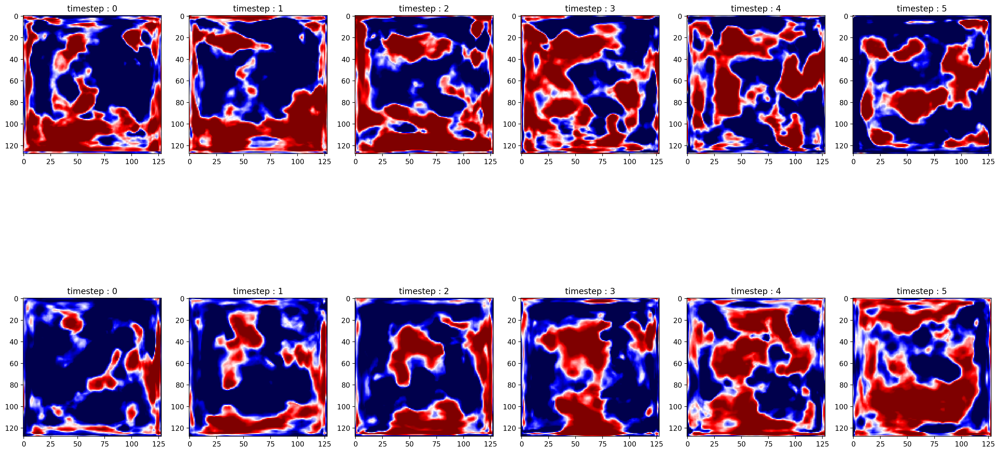

In [22]:


fig, axs = plt.subplots(2, len(samples), figsize=(25,15), dpi=200)
# fig.subplots_adjust(hspace=0.2, wspace=0.2)
for i in range(2):
    for j in range(len(samples)):
        axs[i,j].imshow(samples[j][i,:,:,0], cmap='seismic', vmin = -1.0, vmax=1.0);
        axs[i,j].set_title('timestep : {}'.format(j))
# cax = fig.add_axes([1.0, 0.038, 0.03, 0.948])
# cbar = plt.colorbar(cax=cax, norm = [-10.0, 2.0])     
plt.subplots_adjust(hspace=0)
#  The interpolated points must be part of the same spectra and , if they were temporal transformation, do they lie on the same distribution 


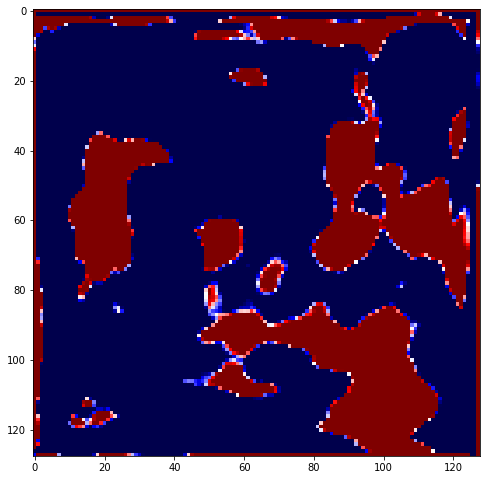

In [22]:
plt.imshow(opt[3,:,:,0], cmap='seismic');

In [8]:
# normalized_omega_data = np.load ( "/global/cscratch1/sd/rgupta2/backup/climate_stylegan/dataset/climate_data_original/1998.npy")
# np.random.shuffle(normalized_omega_data)
# print(normalized_omega_data.shape)



# climate_img_size = 512
# crop_size = 128
# cropped_normalized_omega_data = []
# for i in range (normalized_omega_data.shape[0]):       
#     # offset_width = randint(0, climate_img_size - crop_size-1)
#     offset_width = 192
#     cropped_normalized_omega_data.append(normalized_omega_data[:, -1:, offset_width : offset_width + crop_size , (climate_img_size - crop_size)//2 : (climate_img_size - crop_size)//2 + crop_size])


# # print(cropped_normalized_omega_data[0].shape)
# cropped_normalized_omega_data  = cropped_normalized_omega_data[0]

# new_dataset_logan_annealed_wo_feature_matching_128

# # generated_data = np.load('/global/cscratch1/sd/rgupta2/backup/climate_stylegan/test_samples/original_batch_size_normalized_fixed_offset_192_feature_matching_step_annealing_custom_cropping_logan_annealed_omega_128_71250.npy')


# # print(type(cropped_normalized_omega_data))


climate_counter = 94375


load_path = "/global/cscratch1/sd/rgupta2/backup/climate_stylegan/test_samples/"

omega_generated_data = np.load (load_path +   "new_dataset_logan_annealed_omega_128_{}_mmustafa.npy".format(climate_counter))    
    
np.random.shuffle(omega_generated_data)
print(omega_generated_data.shape)



normalized_omega_data = np.load ( "/project/projectdirs/dasrepo/mustafa/data/climate/sims/normalized/normalized_seven_channels_1998.npy")
np.random.shuffle(normalized_omega_data)
print(normalized_omega_data.shape)



climate_img_size = 512
crop_size = 128
cropped_normalized_omega_data = []
for i in range (normalized_omega_data.shape[0]):       
    # offset_width = randint(0, climate_img_size - crop_size-1)
    offset_width = 192
    cropped_normalized_omega_data.append(normalized_omega_data[:, -1:, offset_width : offset_width + crop_size , (climate_img_size - crop_size)//2 : (climate_img_size - crop_size)//2 + crop_size])


print(cropped_normalized_omega_data[0].shape)
cropped_normalized_omega_data  = cropped_normalized_omega_data[0]
# print(type(cropped_normalized_omega_data))


(750, 128, 128, 1)
(2920, 7, 512, 512)


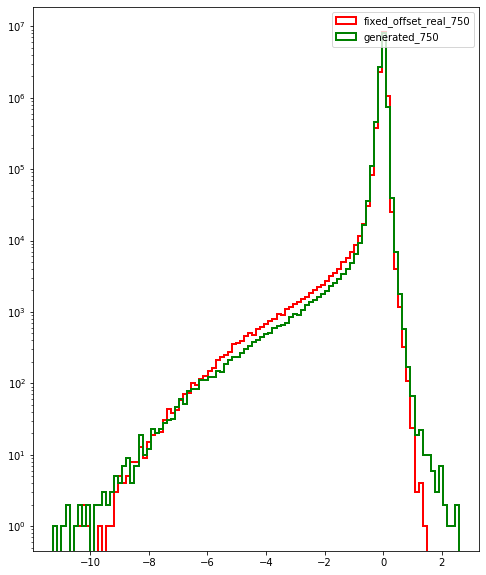

In [9]:
plt.hist([omega_generated_data[-750:].flatten(), cropped_normalized_omega_data[-750:].flatten()  ], color=['g', 'r'], bins=100, linewidth=2 ,histtype='step', label=["generated_750",  "fixed_offset_real_750"])
plt.yscale("log")
plt.legend(loc='best')

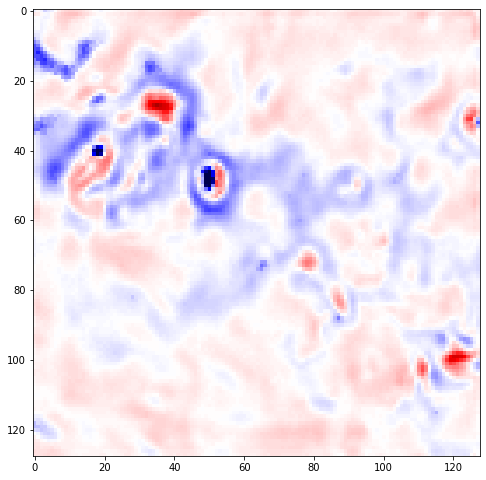

In [11]:
plt.imshow(omega_generated_data[5,:,:,0], cmap='seismic', vmin= -1.0, vmax = 1.0);



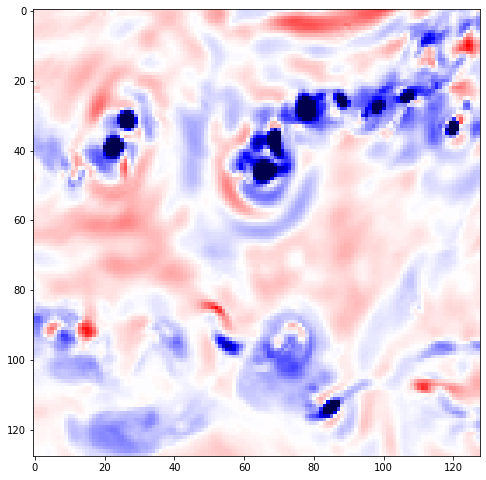

In [12]:
plt.imshow(cropped_normalized_omega_data[5,0,:,:], cmap='seismic', vmin= -1.0, vmax = 1.0);

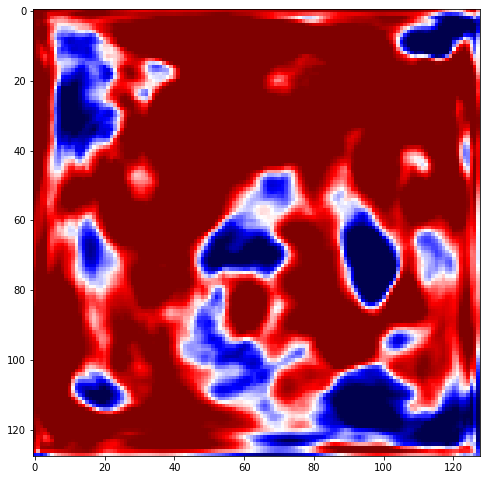

In [43]:
plt.imshow( samples[0][0,:,:,0], cmap='seismic', vmin= -1.0, vmax = 1.0);

In [16]:
subs = 'random_normal'
res = [i for i in tensor_names if subs in i]
for i in tensor_names:
    print(i)

global_step_128/Initializer/zeros:0
global_step_128:0
global_step_128/Assign:0
global_step_128/read:0
Const:0
train_trans_images_per_res:0
mul/x:0
mul:0
LessEqual:0
cond/Switch:0
cond/Switch:1
cond/switch_t:0
cond/switch_f:0
cond/pred_id:0
cond/sub/Switch:0
cond/sub/Switch:1
cond/sub/Switch_1:0
cond/sub/Switch_1:1
cond/sub:0
cond/truediv:0
cond/Switch_1:0
cond/Switch_1:1
cond/Merge:0
cond/Merge:1
alpha_128/Initializer/ones:0
alpha_128:0
alpha_128/Assign:0
alpha_128/read:0
Assign:0
filenames:0
record_bytes:0
header_bytes:0
footer_bytes:0
buffer_size:0
compression_type:0
num_parallel_calls:0
count:0
buffer_size_1:0
seed:0
seed2:0
batch_size:0
drop_remainder:0
buffer_size_2:0
Const_1:0
buffer_size_3:0
OneShotIterator:0
IteratorToStringHandle:0
IteratorGetNext:0
Reshape/shape:0
Reshape:0
random_normal/shape:0
random_normal/mean:0
random_normal/stddev:0
random_normal/RandomStandardNormal:0
random_normal/mul:0
random_normal:0
ExponentialDecay/learning_rate:0
ExponentialDecay/Cast/x:0
Exponen

ValueError: The name 'generator/g_synthesis/128x128_1/ToRGB/add' refers to an Operation, not a Tensor. Tensor names must be of the form "<op_name>:<output_index>".

In [ ]:
for op in tf.get_default_graph().get_operations():
    print(str(op.name))

global_step_128/Initializer/zeros
global_step_128
global_step_128/Assign
global_step_128/read
Const
train_trans_images_per_res
mul/x
mul
LessEqual
cond/Switch
cond/switch_t
cond/switch_f
cond/pred_id
cond/sub/Switch
cond/sub/Switch_1
cond/sub
cond/truediv
cond/Switch_1
cond/Merge
alpha_128/Initializer/ones
alpha_128
alpha_128/Assign
alpha_128/read
Assign
filenames
record_bytes
header_bytes
footer_bytes
buffer_size
compression_type
num_parallel_calls
count
buffer_size_1
seed
seed2
batch_size
drop_remainder
buffer_size_2
Const_1
buffer_size_3
OneShotIterator
IteratorToStringHandle
IteratorGetNext
Reshape/shape
Reshape
random_normal/shape
random_normal/mean
random_normal/stddev
random_normal/RandomStandardNormal
random_normal/mul
random_normal
ExponentialDecay/learning_rate
ExponentialDecay/Cast/x
ExponentialDecay/Cast
ExponentialDecay/Cast_1/x
ExponentialDecay/truediv
ExponentialDecay/Floor
ExponentialDecay/Pow
ExponentialDecay
generator/w_avg/Initializer/zeros
generator/w_avg
generator/